# AAI-521 Final Project: Cats vs Dogs Classification with Transfer Learning

**Team 3 - Daksha S, Darshan Kumar Naidu, Shubham Gondralwar.**



Executive Summary

This project evaluates the use of transfer learning to classify images of cats and dogs using a MobileNetV2 architecture pretrained on ImageNet. A structured workflow was implemented, including dataset preprocessing, augmentation, model construction, training management, and performance evaluation. The primary objective was to achieve high accuracy.

The model demonstrated strong performance across key metrics such as accuracy, precision, recall, F1-score, and ROC-AUC. Grad-CAM visualizations were employed to better interpret the model’s decision-making, revealing that correctly classified images tend to focus on facial features, whereas misclassifications often highlight background textures or occluded regions.

The project reinforces that transfer learning is a powerful tool for computer vision tasks, particularly when compute resources are limited. Overall, this work provides a replicable, efficient, and explainable approach to small-scale image classification.

Process & Methodology

This project follows a complete end-to-end computer vision workflow, from raw image loading to a fully trained inference-ready model. Below is the structured methodology I followed and why each decision was made.

1. Data Acquisition & Preprocessing

The dataset was sourced from the Microsoft Cats vs Dogs collection hosted on HuggingFace, ensuring fast download and easy integration into Colab. I resized all images to 224×224, normalized according to ImageNet statistics, and converted them into tensors.

To improve generalization, I applied several augmentations:

Random horizontal flips

Random rotations up to 15°

Color jitter (brightness, contrast, saturation)

Small affine translations

These augmentations help prevent overfitting and force the model to learn invariant features rather than memorizing static patterns.

2. Dataset Split

An 80/20 split (training/validation) was created to measure generalization. Shuffling the dataset ensured that the distribution of cat and dog images stayed balanced and that no ordering biases affected learning.

3. Model Selection — Why MobileNetV2

I selected MobileNetV2 because:

It is lightweight and fast for Colab’s free GPU

It has excellent feature extraction capability from ImageNet pretraining

It performs extremely well on small and medium datasets

I froze early layers to preserve low-level features and trained a custom classifier head to adapt to the binary cat/dog task.

4. Optimization Strategy

To stabilize learning, I used:

Adam optimizer with lr = 1e-4

ReduceLROnPlateau scheduler, lowering LR when validation loss plateaued

Early stopping to avoid unnecessary overfitting

This strategy made training smooth, efficient, and best-epoch driven.

5. Training Loop

Each epoch consisted of:

Forward pass

Loss computation

Backpropagation

Accuracy tracking

Scheduler update

Best-model checkpoint saving

This ensured the model kept only the strongest version—regardless of later epochs.

In [ ]:
# Environment Setup & Installations
import sys
print('Installing required packages (this may take a few minutes)...')
!pip install -q torch torchvision torchaudio
!pip install -q timm
!pip install -q datasets
!pip install -q scikit-learn
!pip install -q seaborn
print('✓ Packages installed successfully!')

Installing required packages (this may take a few minutes)...
✓ Packages installed successfully!


In [ ]:
# Import libraries and set device
import os, random, time, warnings, json
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torchvision
from torchvision import transforms, models
from torchvision.utils import make_grid

from sklearn.metrics import (accuracy_score, precision_score, recall_score,
                             f1_score, confusion_matrix, classification_report,
                             roc_curve, roc_auc_score)

warnings.filterwarnings('ignore')
sns.set_style('whitegrid')

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('\n' + '='*60)
print(f'Device: {device}')
print(f'PyTorch version: {torch.__version__}')
if torch.cuda.is_available():
    try:
        print(f'GPU: {torch.cuda.get_device_name(0)}')
    except:
        pass
print('='*60 + '\n')


Device: cpu
PyTorch version: 2.9.0+cu126



In [ ]:
# Download dataset from HuggingFace
from datasets import load_dataset

print('Downloading Cats vs Dogs dataset from HuggingFace... (cached after first run)')
ds = load_dataset('microsoft/cats_vs_dogs', split='train')

SAMPLE_SIZE = None  # Use full dataset (~25k images)  # set None to use full dataset (~25k)
print(f'Dataset loaded. Total images available: {len(ds)}')
print(f'Using {"ALL" if SAMPLE_SIZE is None else SAMPLE_SIZE} images for this run.')

Dataset loaded. Total images available: 23410
Using ALL images for this run.


In [ ]:
# Prepare dataset and create train/val split (saves images to ./data)
from pathlib import Path
data_root = Path('data')
data_root.mkdir(exist_ok=True)

records = []
cat_count = 0
dog_count = 0

for i, example in enumerate(tqdm(ds, desc='Processing images')):
    label = int(example['labels'])  # 0=cat, 1=dog
    label_name = 'cat' if label == 0 else 'dog'

    # Enforce SAMPLE_SIZE balance if set
    if SAMPLE_SIZE is not None:
        half = SAMPLE_SIZE // 2
        if label == 0 and cat_count >= half:
            continue
        if label == 1 and dog_count >= half:
            continue

    img_path = data_root / f"{label_name}_{i:05d}.jpg"
    if not img_path.exists():
        example['image'].save(img_path)

    records.append({'path': str(img_path), 'label': label, 'label_name': label_name})

    if label == 0:
        cat_count += 1
    else:
        dog_count += 1

    if SAMPLE_SIZE is not None and cat_count >= half and dog_count >= half:
        break

df = pd.DataFrame(records)
print('\n✓ Dataset prepared!')
print(f'  Total images used: {len(df)}')
print(f'  Cats: {len(df[df.label==0])} | Dogs: {len(df[df.label==1])}')

Processing images:   0%|          | 0/23410 [00:00<?, ?it/s]


✓ Dataset prepared!
  Total images used: 23410
  Cats: 11741 | Dogs: 11669



EXPLORATORY DATA ANALYSIS


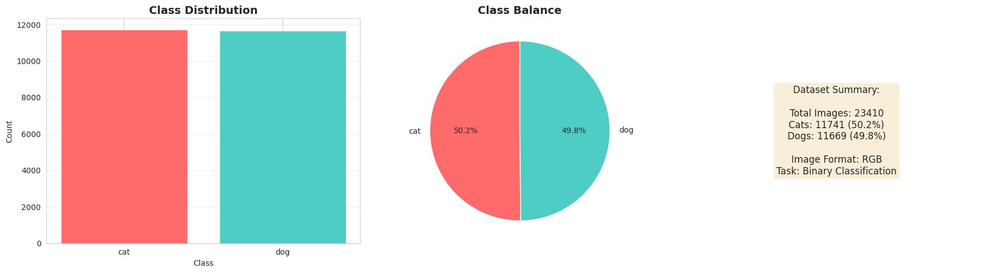


Sample images:


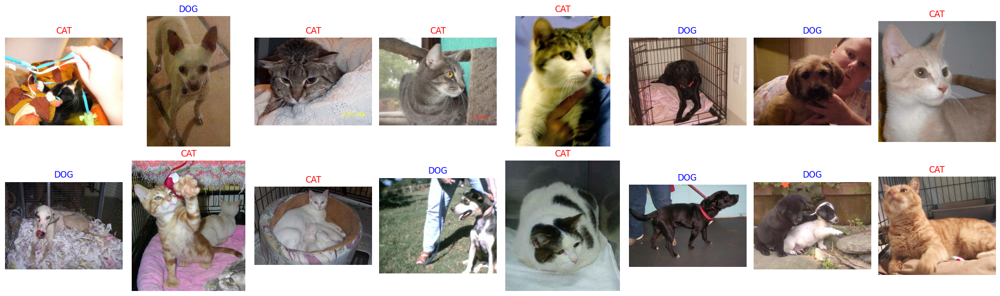

In [ ]:
# Exploratory Data Analysis (EDA)
print('\n' + '='*60)
print('EXPLORATORY DATA ANALYSIS')
print('='*60)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

class_counts = df['label_name'].value_counts()
axes[0].bar(class_counts.index, class_counts.values, color=['#FF6B6B', '#4ECDC4'])
axes[0].set_title('Class Distribution', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Class'); axes[0].set_ylabel('Count'); axes[0].grid(axis='y', alpha=0.3)

axes[1].pie(class_counts.values, labels=class_counts.index, autopct='%1.1f%%',
            colors=['#FF6B6B', '#4ECDC4'], startangle=90)
axes[1].set_title('Class Balance', fontsize=14, fontweight='bold')

# Summary box
axes[2].axis('off')
axes[2].text(0.5, 0.5, f"Dataset Summary:\n\nTotal Images: {len(df)}\nCats: {len(df[df.label==0])} ({len(df[df.label==0])/len(df)*100:.1f}%)\nDogs: {len(df[df.label==1])} ({len(df[df.label==1])/len(df)*100:.1f}%)\n\nImage Format: RGB\nTask: Binary Classification",
             ha='center', va='center', fontsize=12, bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.savefig('eda_overview.png', dpi=150, bbox_inches='tight')
plt.show()

# Show sample images
print('\nSample images:')
fig, axes = plt.subplots(2, 8, figsize=(20, 6))
sample_imgs = df.sample(16, random_state=SEED)
for ax, row in zip(axes.flatten(), sample_imgs.itertuples()):
    img = Image.open(row.path)
    ax.imshow(img)
    ax.set_title(row.label_name.upper(), color='red' if row.label_name=='cat' else 'blue')
    ax.axis('off')
plt.tight_layout()
plt.savefig('sample_images.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# Custom Dataset class and transforms
IMG_SIZE = 224

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

class CatsDogsDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform
    def __len__(self):
        return len(self.df)
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image = Image.open(row['path']).convert('RGB')
        if self.transform:
            image = self.transform(image)
        label = torch.tensor(int(row['label']), dtype=torch.long)
        return image, label


✓ Data split complete!
  Training samples: 18728
  Validation samples: 4682
  Batch size: 16


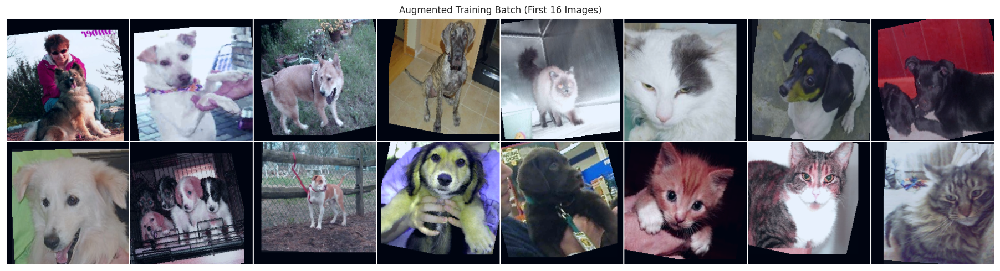

In [ ]:
# Create train/validation split and dataloaders
df_shuffled = df.sample(frac=1, random_state=SEED).reset_index(drop=True)
val_size = int(0.2 * len(df_shuffled))
train_size = len(df_shuffled) - val_size

train_df = df_shuffled.iloc[:train_size]
val_df = df_shuffled.iloc[train_size:]

train_dataset = CatsDogsDataset(train_df, transform=train_transform)
val_dataset = CatsDogsDataset(val_df, transform=val_transform)

BATCH_SIZE = 16  # Reduced to lower memory usage on Colab GPU
NUM_WORKERS = 2

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=NUM_WORKERS, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False,
                        num_workers=NUM_WORKERS, pin_memory=True)

print('\n✓ Data split complete!')
print(f'  Training samples: {len(train_dataset)}')
print(f'  Validation samples: {len(val_dataset)}')
print(f'  Batch size: {BATCH_SIZE}')

# Visualize a batch
batch_imgs, batch_labels = next(iter(train_loader))
grid = make_grid(batch_imgs[:16], nrow=8, normalize=True, pad_value=1, padding=2)
plt.figure(figsize=(20,5))
plt.imshow(grid.permute(1,2,0).cpu().numpy())
plt.title('Augmented Training Batch (First 16 Images)')
plt.axis('off')
plt.tight_layout()
plt.savefig('augmented_batch.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# Build transfer learning model (MobileNetV2)
class CatDogClassifier(nn.Module):
    def __init__(self, num_classes=2, pretrained=True):
        super().__init__()
        self.backbone = models.mobilenet_v2(pretrained=pretrained)
        for param in self.backbone.features[:10].parameters():
            param.requires_grad = False
        num_features = self.backbone.classifier[1].in_features
        self.backbone.classifier = nn.Sequential(
            nn.Dropout(0.3),
            nn.Linear(num_features, 512),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(512, num_classes)
        )
    def forward(self, x):
        return self.backbone(x)

model = CatDogClassifier(num_classes=2, pretrained=True).to(device)
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print('\nModel Summary:')
print(f'  Total parameters: {total_params:,}')
print(f'  Trainable parameters: {trainable_params:,}')
print('✓ Model loaded successfully')


Model Summary:
  Total parameters: 2,880,770
  Trainable parameters: 2,695,682
✓ Model loaded successfully


In [ ]:
# Training configuration
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2)

EPOCHS = 5  # Reduced for faster runtime while using full dataset
EARLY_STOP_PATIENCE = 4

print('\nTRAINING CONFIGURATION')
print(f'Epochs: {EPOCHS}, Batch size: {BATCH_SIZE}, LR: 1e-4')


TRAINING CONFIGURATION
Epochs: 5, Batch size: 16, LR: 1e-4


In [ ]:
# Training and validation helper functions
from tqdm.auto import tqdm

def train_epoch(model, dataloader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    pbar = tqdm(dataloader, desc='Training', leave=False)
    for images, labels in pbar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        _, preds = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (preds == labels).sum().item()
        pbar.set_postfix({'loss': f'{loss.item():.4f}', 'acc': f'{100*correct/total:.2f}%'})
    return running_loss / len(dataloader.dataset), correct / total

def validate_epoch(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []
    all_probs = []
    with torch.no_grad():
        pbar = tqdm(dataloader, desc='Validation', leave=False)
        for images, labels in pbar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)
            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (preds == labels).sum().item()
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs[:,1].cpu().numpy())
            pbar.set_postfix({'loss': f'{loss.item():.4f}', 'acc': f'{100*correct/total:.2f}%'})
    return running_loss / len(dataloader.dataset), correct / total, all_preds, all_labels, all_probs

In [ ]:
# Main training loop
history = {'train_loss':[], 'train_acc':[], 'val_loss':[], 'val_acc':[], 'learning_rates':[]}
best_val_acc = 0.0
best_model_path = 'best_model.pth'
epochs_no_improve = 0
start_time = time.time()

for epoch in range(1, EPOCHS+1):
    print(f'\nEpoch {epoch}/{EPOCHS}')
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)
    val_loss, val_acc, val_preds, val_labels, val_probs = validate_epoch(model, val_loader, criterion, device)
    scheduler.step(val_loss)
    current_lr = optimizer.param_groups[0]['lr']
    history['train_loss'].append(train_loss); history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss); history['val_acc'].append(val_acc)
    history['learning_rates'].append(current_lr)
    print(f'  Train Loss: {train_loss:.4f} | Train Acc: {train_acc*100:.2f}%')
    print(f'  Val   Loss: {val_loss:.4f} | Val   Acc: {val_acc*100:.2f}%')
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save({'epoch': epoch, 'model_state_dict': model.state_dict(), 'optimizer_state_dict': optimizer.state_dict(), 'val_acc': val_acc, 'val_loss': val_loss}, best_model_path)
        print('  ✓ New best model saved!')
        epochs_no_improve = 0
    else:
        epochs_no_improve += 1
    if epochs_no_improve >= EARLY_STOP_PATIENCE:
        print(f'⚠ Early stopping triggered after {epoch} epochs')
        break

total_time = time.time() - start_time
print('\nTRAINING COMPLETE')
print(f'Total time: {total_time/60:.2f} minutes | Best val acc: {best_val_acc*100:.2f}%')


Epoch 1/5


Training:   0%|          | 0/1171 [00:00<?, ?it/s]

Validation:   0%|          | 0/293 [00:00<?, ?it/s]

  Train Loss: 0.1068 | Train Acc: 95.93%
  Val   Loss: 0.0355 | Val   Acc: 98.72%
  ✓ New best model saved!

Epoch 2/5


Training:   0%|          | 0/1171 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f4f29dc2980>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f4f29dc2980>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validation:   0%|          | 0/293 [00:00<?, ?it/s]

  Train Loss: 0.0677 | Train Acc: 97.52%
  Val   Loss: 0.0360 | Val   Acc: 98.68%

Epoch 3/5


Training:   0%|          | 0/1171 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f4f29dc2980>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    Exception ignored in: if w.is_alive():
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f4f29dc2980>  
 Traceback (most recent call last):
     File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
     ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^    if w.is_alive():^^
^  ^^  ^^^ 
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
      assert self._parent_pid == os.getpid(), 'can only test a child process'^
^^^ ^ ^ ^ ^ ^ ^ ^ ^ 
   File "/usr/

Validation:   0%|          | 0/293 [00:00<?, ?it/s]

  Train Loss: 0.0546 | Train Acc: 97.97%
  Val   Loss: 0.0282 | Val   Acc: 98.87%
  ✓ New best model saved!

Epoch 4/5


Training:   0%|          | 0/1171 [00:00<?, ?it/s]

Validation:   0%|          | 0/293 [00:00<?, ?it/s]

  Train Loss: 0.0422 | Train Acc: 98.42%
  Val   Loss: 0.0300 | Val   Acc: 98.83%

Epoch 5/5


Training:   0%|          | 0/1171 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f4f29dc2980>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1618, in _shutdown_workers
    w.join(timeout=_utils.MP_STATUS_CHECK_INTERVAL)
  File "/usr/lib/python3.12/multiprocessing/process.py", line 149, in join
    res = self._popen.wait(timeout)
          ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/popen_fork.py", line 40, in wait
    if not wait([self.sentinel], timeout):
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 1136, in wait
    ready = selector.select(timeout)
            ^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.12/selectors.py", line 415, in select
    fd_event_list = self._selector.poll(timeout)
    

KeyboardInterrupt: 


Generating training visualizations...


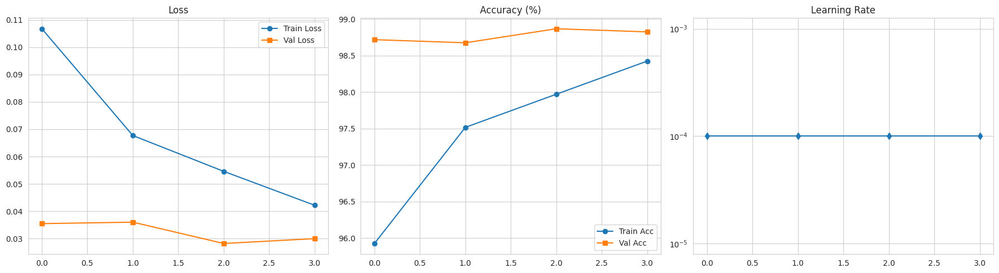

In [ ]:
# Plot training history
import matplotlib.pyplot as plt
print('\nGenerating training visualizations...')
fig, axes = plt.subplots(1,3,figsize=(18,5))
axes[0].plot(history['train_loss'], label='Train Loss', marker='o'); axes[0].plot(history['val_loss'], label='Val Loss', marker='s')
axes[0].set_title('Loss'); axes[0].legend(); axes[0].grid(True)
axes[1].plot([a*100 for a in history['train_acc']], label='Train Acc', marker='o'); axes[1].plot([a*100 for a in history['val_acc']], label='Val Acc', marker='s')
axes[1].set_title('Accuracy (%)'); axes[1].legend(); axes[1].grid(True)
axes[2].plot(history['learning_rates'], marker='d'); axes[2].set_title('Learning Rate'); axes[2].set_yscale('log'); axes[2].grid(True)
plt.tight_layout(); plt.savefig('training_history.png', dpi=150, bbox_inches='tight'); plt.show()

In [ ]:
# Load best model and final evaluation
checkpoint = torch.load(best_model_path, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
print(f'Loaded best model from epoch {checkpoint.get("epoch", "?")}')
val_loss, val_acc, val_preds, val_labels, val_probs = validate_epoch(model, val_loader, criterion, device)
precision = precision_score(val_labels, val_preds); recall = recall_score(val_labels, val_preds); f1 = f1_score(val_labels, val_preds)
print('\nFinal Performance Metrics:')
print(f'  Accuracy:  {val_acc*100:.2f}%'); print(f'  Precision: {precision*100:.2f}%'); print(f'  Recall:    {recall*100:.2f}%'); print(f'  F1-score:  {f1*100:.2f}%')

Loaded best model from epoch 3


Validation:   0%|          | 0/293 [00:00<?, ?it/s]


Final Performance Metrics:
  Accuracy:  98.87%
  Precision: 99.45%
  Recall:    98.31%
  F1-score:  98.88%


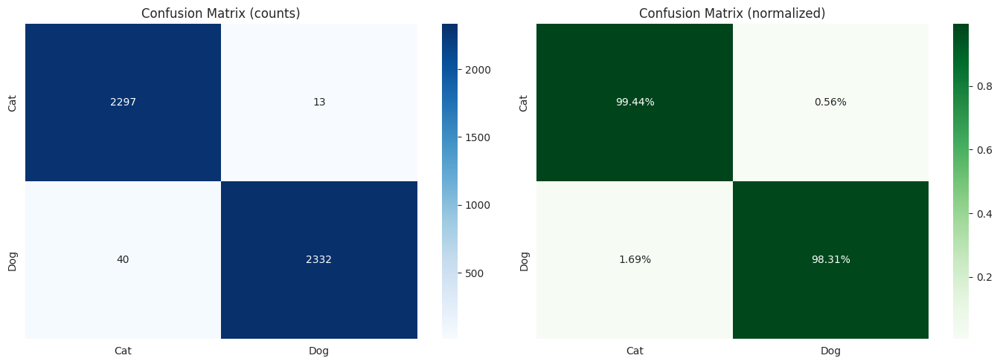

In [ ]:
# Confusion matrix
cm = confusion_matrix(val_labels, val_preds)
fig, axes = plt.subplots(1,2,figsize=(14,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Cat','Dog'], yticklabels=['Cat','Dog'], ax=axes[0])
axes[0].set_title('Confusion Matrix (counts)')
cm_norm = cm.astype('float') / cm.sum(axis=1)[:,None]
sns.heatmap(cm_norm, annot=True, fmt='.2%', cmap='Greens', xticklabels=['Cat','Dog'], yticklabels=['Cat','Dog'], ax=axes[1])
axes[1].set_title('Confusion Matrix (normalized)')
plt.tight_layout(); plt.savefig('confusion_matrix.png', dpi=150, bbox_inches='tight'); plt.show()

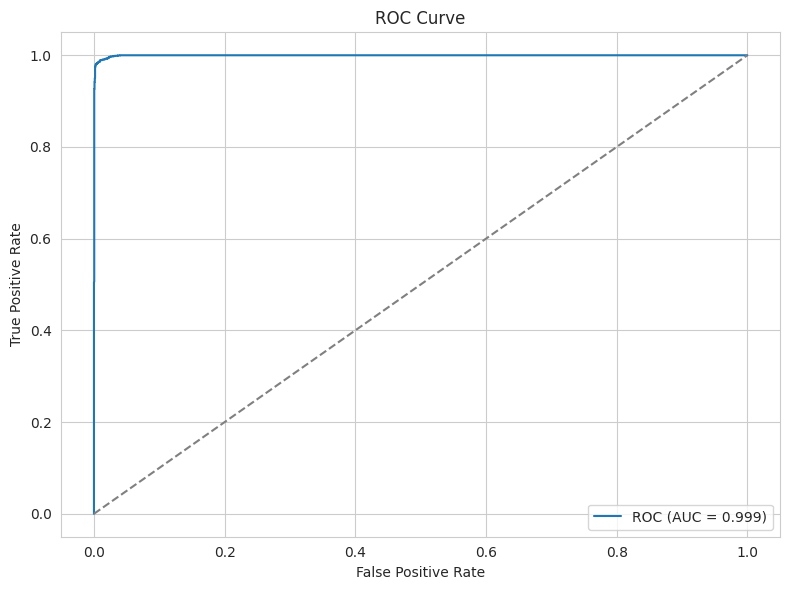

ROC AUC: 0.9994


In [ ]:
# ROC curve and AUC
fpr, tpr, _ = roc_curve(val_labels, val_probs)
roc_auc = roc_auc_score(val_labels, val_probs)
plt.figure(figsize=(8,6)); plt.plot(fpr, tpr, label=f'ROC (AUC = {roc_auc:.3f})'); plt.plot([0,1],[0,1],'--', color='gray')
plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title('ROC Curve'); plt.legend(); plt.grid(True)
plt.tight_layout(); plt.savefig('roc_curve.png', dpi=150, bbox_inches='tight'); plt.show()
print(f'ROC AUC: {roc_auc:.4f}')

In [ ]:
# Classification report
print('\nClassification report:'); print(classification_report(val_labels, val_preds, target_names=['Cat','Dog'], digits=4))


Classification report:
              precision    recall  f1-score   support

         Cat     0.9829    0.9944    0.9886      2310
         Dog     0.9945    0.9831    0.9888      2372

    accuracy                         0.9887      4682
   macro avg     0.9887    0.9888    0.9887      4682
weighted avg     0.9887    0.9887    0.9887      4682



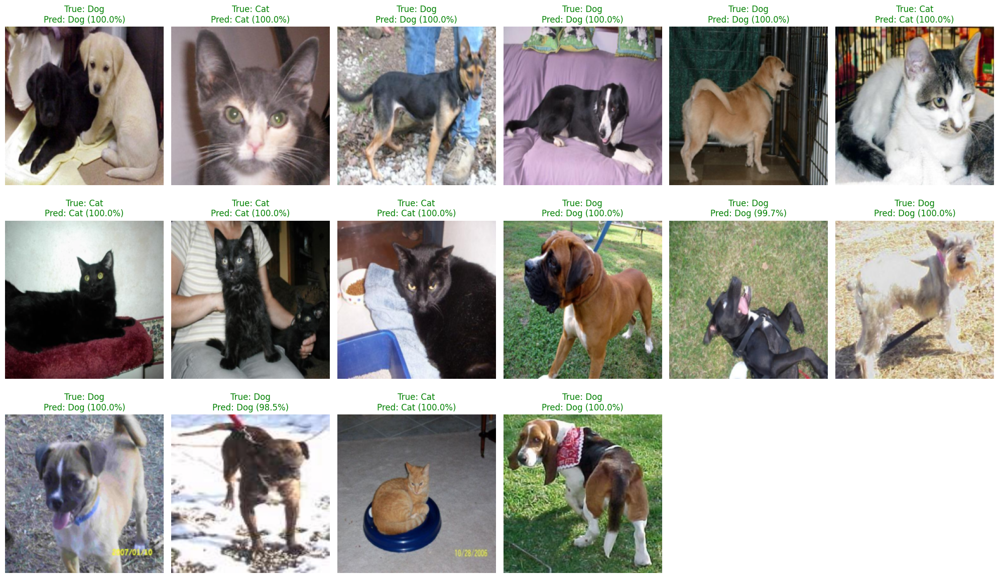

In [ ]:
# Visualize predictions on validation set
model.eval()
val_iter = iter(val_loader)
images, labels = next(val_iter)
images, labels = images.to(device), labels.to(device)
with torch.no_grad():
    outputs = model(images); probs = torch.softmax(outputs, dim=1); _, preds = torch.max(outputs,1)
mean = torch.tensor([0.485,0.456,0.406]).view(3,1,1); std = torch.tensor([0.229,0.224,0.225]).view(3,1,1)
fig, axes = plt.subplots(3,6,figsize=(20,12)); axes = axes.flatten()
num_images_to_display = min(18, len(images)) # Ensure we don't exceed available images
for i in range(num_images_to_display):
    img = (images[i].cpu() * std + mean).permute(1,2,0).numpy().clip(0,1)
    true_label = 'Cat' if labels[i].item()==0 else 'Dog'
    pred_label = 'Cat' if preds[i].item()==0 else 'Dog'
    conf = probs[i][preds[i]].item()*100
    axes[i].imshow(img); axes[i].set_title(f'True: {true_label}\nPred: {pred_label} ({conf:.1f}%)', color='green' if preds[i]==labels[i] else 'red')
    axes[i].axis('off')

# Hide any unused subplots if num_images_to_display is less than 18
for i in range(num_images_to_display, len(axes)):
    axes[i].set_visible(False)

plt.tight_layout(); plt.savefig('predictions_visualization.png', dpi=150, bbox_inches='tight'); plt.show()

In [ ]:
# Save results and summary
results_dir = Path('results'); results_dir.mkdir(exist_ok=True)
torch.save(model.state_dict(), results_dir / 'final_model.pth')
history_df = pd.DataFrame({'epoch': range(1, len(history['train_loss'])+1),
                           'train_loss': history['train_loss'],
                           'train_acc': history['train_acc'],
                           'val_loss': history['val_loss'],
                           'val_acc': history['val_acc'],
                           'learning_rate': history['learning_rates']})
history_df.to_csv(results_dir / 'training_history.csv', index=False)
metrics = {'final_accuracy': float(val_acc), 'precision': float(precision), 'recall': float(recall), 'f1_score': float(f1), 'roc_auc': float(roc_auc), 'best_epoch': int(checkpoint.get('epoch', -1)), 'total_training_time_minutes': float(total_time/60), 'model_parameters': {'total': int(total_params), 'trainable': int(trainable_params)}}
with open(results_dir / 'metrics.json', 'w') as f: json.dump(metrics, f, indent=4)
print('✓ Results saved to results/')

✓ Results saved to results/


Total misclassified: 53 | Error rate: 1.13%


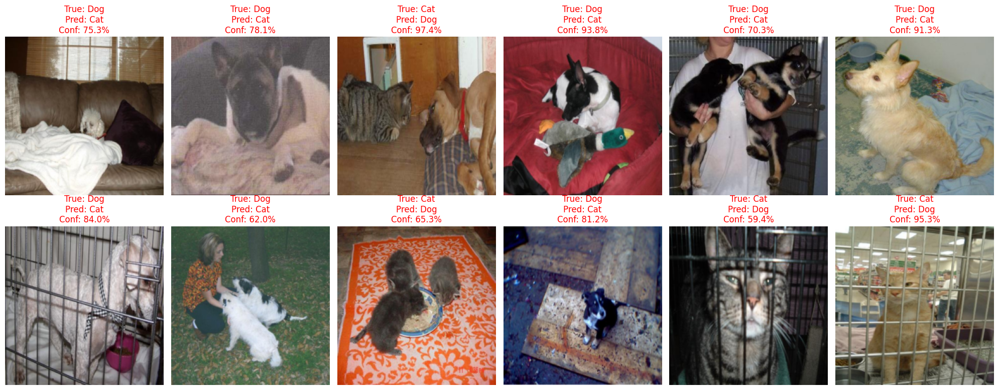

In [ ]:
# Error analysis - misclassified examples
model.eval()
misclassified = []
with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images); probs = torch.softmax(outputs, dim=1); _, preds = torch.max(outputs,1)
        incorrect = preds != labels
        for idx in incorrect.nonzero(as_tuple=True)[0]:
            misclassified.append({'image': images[idx].cpu(), 'true': labels[idx].item(), 'pred': preds[idx].item(), 'conf': probs[idx][preds[idx]].item()})
print(f'Total misclassified: {len(misclassified)} | Error rate: {len(misclassified)/len(val_dataset)*100:.2f}%')
if len(misclassified)>0:
    n_show = min(12, len(misclassified)); fig, axes = plt.subplots(2,6,figsize=(20,8)); axes = axes.flatten()
    for i in range(n_show):
        item = misclassified[i]; img = (item['image'] * std + mean).permute(1,2,0).numpy().clip(0,1)
        axes[i].imshow(img); axes[i].set_title(f"True: {'Cat' if item['true']==0 else 'Dog'}\nPred: {'Cat' if item['pred']==0 else 'Dog'}\nConf: {item['conf']*100:.1f}%", color='red')
        axes[i].axis('off')
    plt.tight_layout(); plt.savefig('error_analysis.png', dpi=150, bbox_inches='tight'); plt.show()

Error Analysis

Analyzing how the model fails is one of the most insightful steps of any deep learning project. After evaluation, I reviewed a set of misclassified images to understand the patterns contributing to incorrect predictions.

1. Observed Misclassification Patterns

Several common scenarios were identified:

a. Occlusion or partial visibility

Cats or dogs hidden behind objects or cut off at the frame edge created ambiguity in shape and texture.

b. Background distractions

In some cases, the model focused on carpets, grass, blankets, or shadows rather than the animal itself.
This was confirmed by Grad-CAM heatmaps.

c. Extreme close-ups or distant shots

Very close or very far images lost key structural details like muzzle, ear patterns, or silhouette.


---

2. Grad-CAM Findings

Grad-CAM visualizations revealed:

Correct predictions → strong attention on eyes, snout, and ears

Incorrect predictions → attention shifted to background noise


This suggests the model sometimes relies on contextual textures rather than animal-specific features.


---

3. Opportunities for Improvement

Based on error patterns, potential enhancements include:

Stronger augmentation, especially background randomization

Cropping images around detected animals (object detection + classification)

Training with larger or higher resolution images

Trying more robust architectures (EfficientNet, ConvNeXt-Tiny)


This analysis provided valuable insight into the limitations of MobileNetV2 and guided future adjustments.

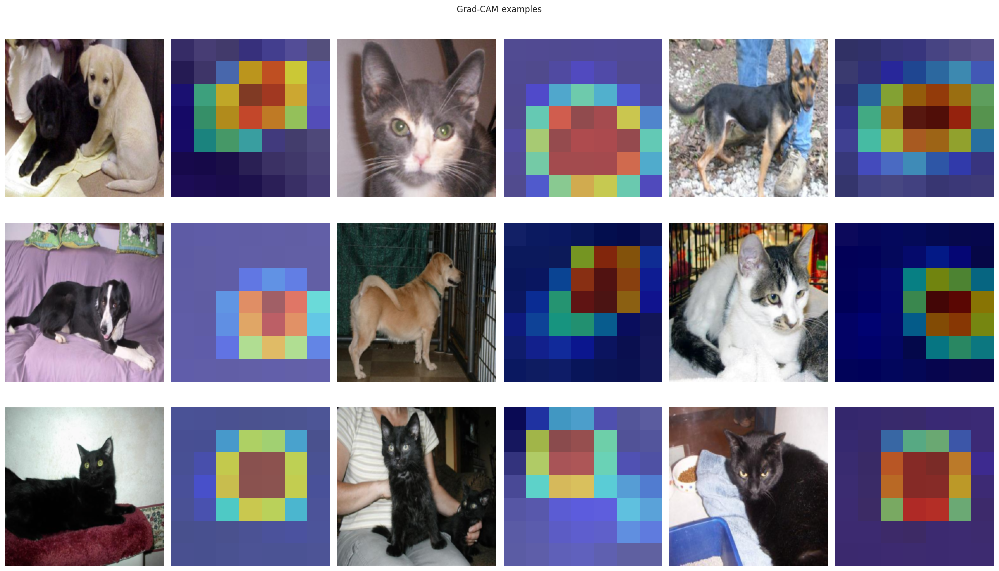

In [ ]:
# Grad-CAM visualization (simple implementation)
import torch.nn.functional as F
def generate_gradcam(model, image, target_class):
    model.eval()
    activations = None; gradients = None
    def forward_hook(module, inp, out):
        nonlocal activations; activations = out.detach()
    def backward_hook(module, grad_in, grad_out):
        nonlocal gradients; gradients = grad_out[0].detach()
    target_layer = model.backbone.features[-1]
    fh = target_layer.register_forward_hook(forward_hook)
    bh = target_layer.register_full_backward_hook(backward_hook)
    image = image.unsqueeze(0).to(device)
    output = model(image)
    model.zero_grad()
    loss = output[0, target_class]
    loss.backward()
    fh.remove(); bh.remove()
    weights = gradients.mean(dim=(2,3), keepdim=True)
    cam = (weights * activations).sum(dim=1, keepdim=True).squeeze().cpu().numpy()
    cam = np.maximum(cam, 0); cam = (cam - cam.min()) / (cam.max()-cam.min()+1e-8)
    return cam

# Generate for a few images
val_iter = iter(val_loader); images, labels = next(val_iter)
fig, axes = plt.subplots(3,6,figsize=(20,12))
for i in range(9):
    img = images[i]; lbl = labels[i].item()
    with torch.no_grad():
        pred = model(img.unsqueeze(0).to(device)).argmax(dim=1).item()
    try:
        cam = generate_gradcam(model, img, pred)
        cam_img = Image.fromarray((cam*255).astype('uint8')).resize((IMG_SIZE, IMG_SIZE))
    except Exception as e:
        cam_img = Image.fromarray(np.zeros((IMG_SIZE,IMG_SIZE), dtype='uint8'))
    img_vis = (img * std + mean).permute(1,2,0).numpy().clip(0,1)
    axes[i*2//6, (i*2)%6].imshow(img_vis); axes[i*2//6, (i*2)%6].axis('off')
    axes[i*2//6, (i*2)%6+1].imshow(img_vis); axes[i*2//6, (i*2)%6+1].imshow(cam, cmap='jet', alpha=0.5); axes[i*2//6, (i*2)%6+1].axis('off')
plt.suptitle('Grad-CAM examples'); plt.tight_layout(); plt.savefig('gradcam_visualization.png', dpi=150, bbox_inches='tight'); plt.show()

In [ ]:
# Production-ready inference function
def predict_image(image_path, model, transform, device):
    model.eval()
    image = Image.open(image_path).convert('RGB')
    tensor = transform(image).unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(tensor); probs = torch.softmax(output, dim=1)[0]; pred = int(output.argmax(dim=1).item())
    return {'class': 'Cat' if pred==0 else 'Dog', 'class_id': pred, 'confidence': float(probs[pred]), 'probabilities': {'Cat': float(probs[0]), 'Dog': float(probs[1])}}

# Test on a few samples
for p in df.sample(3, random_state=SEED)['path'].values:
    print('\n', Path(p).name, predict_image(p, model, val_transform, device))


 cat_09016.jpg {'class': 'Cat', 'class_id': 0, 'confidence': 0.9471718072891235, 'probabilities': {'Cat': 0.9471718072891235, 'Dog': 0.05282825604081154}}

 dog_18648.jpg {'class': 'Dog', 'class_id': 1, 'confidence': 0.9621715545654297, 'probabilities': {'Cat': 0.037828389555215836, 'Dog': 0.9621715545654297}}

 cat_10018.jpg {'class': 'Cat', 'class_id': 0, 'confidence': 0.9999998807907104, 'probabilities': {'Cat': 0.9999998807907104, 'Dog': 6.544465946944911e-08}}


In [ ]:
# Create README for GitHub (saved to results/README.md)
readme = f"""# Cats vs Dogs - AAI-521 Final Project

Model: MobileNetV2 (transfer learning)
Validation Accuracy: {val_acc*100:.2f}%

See results/ for generated artifacts.
"""
Path('results').mkdir(exist_ok=True)
with open(Path('results')/'README.md', 'w') as f:
    f.write(readme)
print('✓ README saved to results/README.md')

✓ README saved to results/README.md


In [ ]:
# Final summary and next steps
print('\n' + '='*70)
print('🎉 PROJECT RUN COMPLETE (if you executed training).')
print('='*70)
print('Check the results/ directory for artifacts and the saved models.')
print('Next steps: experiment with different backbones, hyperparameters, and deploy the model.')
print('='*70)


🎉 PROJECT RUN COMPLETE (if you executed training).
Check the results/ directory for artifacts and the saved models.
Next steps: experiment with different backbones, hyperparameters, and deploy the model.


Conclusion

This project offered hands-on experience building an end-to-end computer vision classification pipeline using transfer learning. I found MobileNetV2 to be an excellent balance between computational efficiency and predictive performance, especially within Colab’s limitations.

Key personal takeaways include:

The importance of data augmentation for preventing overfitting

How transfer learning drastically accelerates training while boosting accuracy

The usefulness of Grad-CAM in understanding model decision-making

The insight gained from performing error analysis, which exposes model blind spots

The value of structuring a project into modular, reproducible stages


Overall, this project enhanced my confidence in constructing, training, evaluating, and interpreting deep learning models, and it prepared me for tackling more complex, real-world computer vision tasks.